# VLM на практике: Reasoning, Tool Calling, Serving
## Лекция 2/2


---

# Часть 1. Практика работы с VLM


---

## 1. Reasoning в LLM: что это, зачем и как учат

### 1.1 Что такое reasoning

В широком смысле *reasoning* — это способность модели порождать промежуточные шаги рассуждения перед выдачей финального ответа. Идея восходит к методу **Chain-of-Thought (CoT)** prompting: если попросить модель написать «Думай шаг за шагом», качество ответа на сложных задачах заметно растёт. Причина проста: вместо того чтобы «упаковать» многоступенчатый вывод в один токен, модель разворачивает его в цепочку токенов, каждый из которых опирается на предыдущие.

> **Интересный факт.** Авторы DeepSeek-R1 заметили, что у достаточно мощного base-модели уже в процессе RL-обучения стихийно возникает «aha-moment» — момент, когда модель начинает самостоятельно перепроверять своё решение и менять ход рассуждения. Это не инженерная конструкция, а **эмерджентное поведение**.

Формально: пусть задача — ответить на вопрос $q$. Стандартный авторегрессионный декодер выдаёт $p(a \mid q)$. Reasoning-модель вместо этого порождает:

$$
p(a \mid q) = \sum_{r} p(a \mid q, r)\, p(r \mid q),
$$

где $r$ — цепочка рассуждения (*reasoning trace*). На практике модель не маргинализует явно, а порождает $r$ авторегрессионно, а затем $a$ — с условностью на $r$.

**Ключевые свойства reasoning-трейса:**
- Хранится в специальных тегах: `<think>…</think>` (DeepSeek-R1, Qwen3), `<thinking>…</thinking>` (Claude).
- Не является частью финального ответа, но **присутствует в контексте** и влияет на него.
- Может содержать самокоррекцию, backtracking, верификацию промежуточных результатов.

### 1.2 Как учат reasoning-модели

Пайплайн на примере **DeepSeek-R1** (наиболее подробно задокументированный open-source вариант):

#### Шаг 0: Сильная base-модель

Отправная точка — мощная base-модель (DeepSeek-V3-Base), предобученная на триллионах токенов. Без качественного претрейна RL не работает: модель не может самостоятельно генерировать правдоподобные трейсы.

#### Шаг 1: Cold Start (SFT на небольшом количестве CoT-данных)

Собирается небольшой набор (~нескольких тысяч) высококачественных примеров с длинными reasoning-трейсами. Цель — дать модели «грамматику» рассуждения: научить её использовать `<think>` теги и писать связные многоступенчатые выкладки. Без cold start RL-обучение нестабильно на ранних итерациях.

#### Шаг 2: Reasoning-Oriented RL (GRPO) (Подробно может быть обсудим позже)

Основная часть обучения. Используется алгоритм **Group Relative Policy Optimization (GRPO)** — вариант PPO, адаптированный для LLM. Ключевая идея GRPO: вместо обучения отдельной value-сети преимущество (advantage) считается относительно группы из \(G\) ответов, сгенерированных самой же моделью на один и тот же запрос:

$$
A_i = \frac{r_i - \mathrm{mean}(\{r_j\}_{j=1}^G)}{\mathrm{std}(\{r_j\}_{j=1}^G)},
$$

где $r_i$ — reward для $i$-го ответа в группе. Оптимизируемый objective (с clipping, аналогично PPO):

$$
\mathcal{L}_{\text{GRPO}}(\theta) = -\mathbb{E}\!\left[\sum_{i=1}^{G} \min\!\left(\frac{\pi_\theta(o_i|q)}{\pi_{\theta_{\text{old}}}(o_i|q)} A_i,\; \mathrm{clip}\!\left(\frac{\pi_\theta(o_i|q)}{\pi_{\theta_{\text{old}}}(o_i|q)},\, 1-\varepsilon,\, 1+\varepsilon\right) A_i\right)\right] + \beta\, D_{\mathrm{KL}}(\pi_\theta \| \pi_{\mathrm{ref}}),
$$

где $\pi_{\mathrm{ref}}$ — reference policy (frozen checkpoint), $\beta$ — коэффициент KL-штрафа.

**Функция награды (reward):**

DeepSeek-R1 использует *verifiable rewards* — правила, не требующие отдельной reward model:
- **Accuracy reward**: ответ сравнивается с ground truth (для математики — exact match, для кода — выполнение тестов).
- **Format reward**: наличие правильных тегов `<think>…</think>`.

Намеренно **не** используется нейросетевая reward model во избежание reward hacking.

```python
def compute_reward(response: str, ground_truth: str) -> float:
    # Извлекаем финальный ответ (вне тегов <think>)
    answer = extract_answer(response)
    accuracy_reward = 1.0 if normalize(answer) == normalize(ground_truth) else 0.0

    # Проверяем формат: теги должны присутствовать
    has_think_open  = "<think>"  in response
    has_think_close = "</think>" in response
    format_reward = 0.1 if (has_think_open and has_think_close) else -0.5

    return accuracy_reward + format_reward
```

#### Шаг 3: Rejection Sampling + SFT (второй раунд)

После RL-обучения из промежуточного чекпойнта генерируются ответы rejection sampling'ом: оставляют только те трейсы, где ответ верен. Полученные данные используются для SFT-дообучения, что стабилизирует модель и улучшает читаемость рассуждений.

#### Шаг 4: RL for All Scenarios

Ещё один раунд RL, но теперь с расширенным набором задач: не только math/code, но и helpfulness, harmlessness (reward model для общих задач).

#### Distillation reasoning-способностей

Меньшие модели (1.5B–14B) получают reasoning-трейсы от большой модели и обучаются на них через SFT. Авторы показали, что дистилляция из большой reasoning-модели значительно превосходит прямое RL-обучение маленькой модели — это практически важный факт при ограниченных ресурсах.

### 1.3 Как использовать reasoning и что он даёт

**Что даёт:**
- Устойчивый прирост на задачах с верифицируемым ответом: math, coding, science, multi-step QA.
- Возможность аудита: пользователь видит, *как* модель пришла к ответу.
- Для VLM: рассуждение над пространственными отношениями, геометрическими задачами, диаграммами.

**Как управлять:**

В Qwen3 reasoning управляется через **chat template** (подробнее в следующем разделе). Параметр `enable_thinking`:
- `True` → модель вправе решить сама, думать ли.
- `False` → в шаблоне подставляются пустые `<think></think>` теги, сигнализируя модели «не думать».

```python
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained("Qwen/Qwen3-8B")

messages = [{"role": "user", "content": "Докажи, что √2 иррационально."}]

# Режим с reasoning
prompt_think = tokenizer.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True,
    chat_template_kwargs={"enable_thinking": True},
)

# Режим без reasoning
prompt_no_think = tokenizer.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True,
    chat_template_kwargs={"enable_thinking": False},
)
```

**Парсинг reasoning из ответа:**

```python
import re

def parse_response(full_output: str) -> dict:
    think_match = re.search(r"<think>(.*?)</think>", full_output, re.DOTALL)
    # Всё после </think> — финальный ответ
    answer = re.sub(r"<think>.*?</think>", "", full_output, flags=re.DOTALL).strip()
    return {
        "reasoning": think_match.group(1).strip() if think_match else None,
        "answer": answer,
    }
```

> **Важно:** reasoning-трейс не нужно передавать обратно в историю диалога как часть ответа ассистента. Ряд фреймворков (vLLM с reasoning parser) автоматически стрипает `<think>` блок из `content` и кладёт его в отдельное поле `reasoning_content`. Следите за этим при реализации multi-turn диалога.

---


## 2. Chat Template: как модель видит разговор

### 2.1 Что такое chat template

LLM — это просто функция $p(x_t \mid x_{<t})$. Никакой «магии диалога» внутри нет: всё — один длинный поток токенов. **Chat template** — это Jinja2-шаблон, который сериализует структурированный список `messages` (список словарей `{"role": ..., "content": ...}`) в плоскую строку токенов.

Без корректного template модель видит не то, на чём обучалась, и деградирует.

### 2.2 Анатомия формата ChatML (Qwen3)

Qwen3 использует формат **ChatML**. Специальные токены:
- `<|im_start|>` — начало сообщения (im = *imagenet message*, исторически).
- `<|im_end|>` — конец сообщения.

Структура одного turn:

```
<|im_start|>{role}\n{content}<|im_end|>\n
```

Полный пример диалога **без** reasoning:

```
<|im_start|>system
You are a helpful assistant.<|im_end|>
<|im_start|>user
Чему равно 2+2?<|im_end|>
<|im_start|>assistant
<think></think>
4<|im_end|>
```

**С** reasoning (`enable_thinking=True`, модель решила думать):

```
<|im_start|>user
Чему равно 2+2?<|im_end|>
<|im_start|>assistant
<think>
2 плюс 2 равно 4.
</think>
4<|im_end|>
```

**`add_generation_prompt=True`** добавляет в конец `<|im_start|>assistant\n`, открывая «слот» для генерации.

### 2.3 Полный разбор Qwen3 chat template

Упрощённая логика шаблона (псевдокод):

```jinja2
{# 1. System prompt (если есть) #}
{%- if messages[0].role == "system" %}
<|im_start|>system
{{ messages[0].content }}<|im_end|>
{%- endif %}

{# 2. Находим последний non-tool user turn для rolling checkpoint #}
{%- set ns = namespace(last_user_idx=-1) %}
{%- for i in range(messages|length - 1, -1, -1) %}
  {%- if messages[i].role == "user" and messages[i].content is not none %}
    {%- if ns.last_user_idx == -1 %}
      {%- set ns.last_user_idx = i %}
    {%- endif %}
  {%- endif %}
{%- endfor %}

{# 3. Рендерим сообщения #}
{%- for message in messages %}
<|im_start|>{{ message.role }}
  {%- if message.role == "assistant" %}
    {%- if enable_thinking %}
      {# Если это старое сообщение — стрипаем <think> блок (rolling checkpoint) #}
      {%- if loop.index0 < ns.last_user_idx %}
        {{ message.content | strip_think_tags }}
      {%- else %}
        {{ message.content }}  {# Оставляем полный reasoning для активного плана #}
      {%- endif %}
    {%- else %}
      <think></think>
      {{ message.content | strip_think_tags }}
    {%- endif %}
  {%- else %}
    {{ message.content }}
  {%- endif %}
<|im_end|>
{%- endfor %}

{%- if add_generation_prompt %}
<|im_start|>assistant
{%- if not enable_thinking %}
<think></think>
{%- endif %}
{%- endif %}
```

**Rolling checkpoint** — ключевая инновация Qwen3: при многоходовых диалогах с tool calls reasoning-блоки старых assistant-сообщений **стрипаются**, но последний активный reasoning **сохраняется**. Это балансирует между полнотой контекста и экономией токенов.

### 2.4 Chat templates других архитектур

#### LLaVA / LLaMA 3 (Vicuna-style)

```
<|begin_of_text|><|start_header_id|>system<|end_header_id|>
You are a helpful assistant.<|eot_id|>
<|start_header_id|>user<|end_header_id|>
{content}<|eot_id|>
<|start_header_id|>assistant<|end_header_id|>
```

Специальные токены: `<|begin_of_text|>`, `<|start_header_id|>`, `<|end_header_id|>`, `<|eot_id|>`.

#### InternVL (InternLM-based)

```
<s><|im_start|>system\n{system}<|im_end|>
<|im_start|>user\n{content}<|im_end|>
<|im_start|>assistant\n
```

Похоже на ChatML, но с `<s>` как BOS.

#### Gemma 3 (Google)

```
<bos><start_of_turn>user
{content}<end_of_turn>
<start_of_turn>model
```

Специальные токены: `<bos>`, `<start_of_turn>`, `<end_of_turn>`. Нет `system` роли как отдельного turn'а — system prompt вставляется в начало первого user-сообщения.

#### GLM-4V

```
[gMASK]<sop><|user|>
{content}
<|assistant|>
```

Использует `[gMASK]` и `<sop>` (start of passage) как legacy-токены из эпохи autoregressive GLM.

> **Практическое следствие.** При смене модели всегда проверяйте, что tokenizer подгружает правильный шаблон. Если нет — явно передайте chat_template строкой. Несоответствие шаблона = тихая деградация качества.

---


## 3. Grounding на примере Qwen3-VL

### 3.1 Что такое visual grounding

**Visual grounding** — задача локализации объекта в изображении по текстовому описанию: на входе изображение + текстовый запрос, на выходе — bounding box (или набор боксов / keypoints).

Qwen2-VL и Qwen3-VL решают grounding **авторегрессионно** — то есть координаты боксов генерируются как обычный текст, в виде токенов.

### 3.2 Специальные токены для grounding

В Qwen2-VL и Qwen3-VL используется следующее соглашение:

| Токен | Роль |
|---|---|
| `<\|object_ref_start\|>` | Начало текстового описания объекта |
| `<\|object_ref_end\|>` | Конец описания объекта |
| `<\|box_start\|>` | Начало координат bounding box |
| `<\|box_end\|>` | Конец координат bounding box |
| `<\|point_start\|>` | Начало точечных координат |
| `<\|point_end\|>` | Конец точечных координат |
| `<\|quad_start\|>` | Начало четырёхугольника (для OCR) |
| `<\|quad_end\|>` | Конец четырёхугольника |

**Формат координат** — нормализованные значения в диапазоне [0, 1000], записанные как `(x1,y1),(x2,y2)` для bounding box или `(cx,cy)` для точки:

```
<|object_ref_start|>кошка<|object_ref_end|>
<|box_start|>(123,456),(678,789)<|box_end|>
```

Координаты нормализуются относительно размера изображения после препроцессинга:

$$
x_{\text{norm}} = \left\lfloor \frac{x_{\text{pixel}}}{W} \times 1000 \right\rfloor, \quad y_{\text{norm}} = \left\lfloor \frac{y_{\text{pixel}}}{H} \times 1000 \right\rfloor.
$$

### 3.3 Пример: object detection через Qwen2.5-VL

<!-- ВСТАВИТЬ СКРИНШОТ: пример grounding-ответа Qwen3-VL с bbox вокруг объектов (из официального репозитория или статьи) -->

```python
from transformers import Qwen2_5_VLForConditionalGeneration, AutoProcessor
from qwen_vl_utils import process_vision_info

model = Qwen2_5_VLForConditionalGeneration.from_pretrained(
    "Qwen/Qwen2.5-VL-72B-Instruct", torch_dtype="auto", device_map="auto"
)
processor = AutoProcessor.from_pretrained("Qwen/Qwen2.5-VL-7B-Instruct")

messages = [{
    "role": "user",
    "content": [
        {"type": "image", "image": "path/to/image.jpg"},
        {"type": "text",  "text": "Detect all people in the image."}
    ]
}]

text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
image_inputs, video_inputs = process_vision_info(messages)
inputs = processor(text=[text], images=image_inputs, return_tensors="pt").to(model.device)

output_ids = model.generate(**inputs, max_new_tokens=512)
response = processor.batch_decode(output_ids, skip_special_tokens=False)[0]
print(response)
# Ожидаемый вывод:
# <|object_ref_start|>person<|object_ref_end|><|box_start|>(123,200),(345,890)<|box_end|>
# <|object_ref_start|>person<|object_ref_end|><|box_start|>(567,180),(789,870)<|box_end|>
```

**Парсинг ответа:**

```python
import re

def parse_grounding_output(text: str, img_w: int, img_h: int) -> list[dict]:
    pattern = r"<\|object_ref_start\|>(.*?)<\|object_ref_end\|>\s*<\|box_start\|>\((\d+),(\d+)\),\((\d+),(\d+)\)<\|box_end\|>"
    results = []
    for m in re.finditer(pattern, text):
        label, x1, y1, x2, y2 = m.group(1), *map(int, m.groups()[1:])
        # Денормализация
        results.append({
            "label": label,
            "box": [x1 * img_w // 1000, y1 * img_h // 1000,
                    x2 * img_w // 1000, y2 * img_h // 1000],
        })
    return results
```

### 3.4 Keypoint detection

Qwen3-VL поддерживает keypoints (точки), например для лиц и поз:

```
Detect the nose of the person.
→ <|object_ref_start|>nose<|object_ref_end|><|point_start|>(512,234)<|point_end|>
```

### 3.5 Как модель обучалась grounding

Данные для grounding собираются как **image-caption-box тройки**. Сначала изображение аннотируется детекторами (DINO, SAM), получая боксы. Затем caption пишется или генерируется для каждого объекта. Модель учится на SFT-задачах вида:

- *"Locate {object} in the image"* → `<|box_start|>…<|box_end|>`
- *"Describe the image with grounding"* → caption + инлайн-боксы

Qwen3-VL дополнительно проходит через **RL-стадию** для улучшения точности локализации: reward считается по IoU предсказанного и ground-truth бокса.

> **Интересный момент.** Модель порождает координаты боксов **как текст**, то есть архитектурно это не отличается от генерации числа «42». Точность локализации, которую удаётся достичь таким образом, впечатляет — но она всё же ниже специализированных детекторов (DINO, YOLO) на стандартных бенчмарках. Выгода подхода в **гибкости**: open-vocabulary, multi-target, совмещение с reasoning.

---



## 4. Tool Calling: пошаговый разбор

### 4.1 Концепция

**Tool calling (function calling)** — механизм, при котором LLM в ответ на запрос не просто генерирует текст, а структурированно «просит» выполнить внешнюю функцию, передавая ей аргументы. Это позволяет строить агентов, способных взаимодействовать с API, базами данных, браузером и т.д.

Ключевое: **модель сама не выполняет** инструмент. Она генерирует JSON-описание вызова; хост-приложение парсит его, вызывает функцию, и возвращает результат обратно в контекст.

### 4.2 Как описываются инструменты: JSON Schema

Каждый инструмент описывается в формате **JSON Schema** и передаётся в системный промпт (через chat template) перед основным диалогом:

```python
tools = [
    {
        "type": "function",
        "function": {
            "name": "get_weather",
            "description": "Получить текущую погоду в городе.",
            "parameters": {
                "type": "object",
                "properties": {
                    "city": {
                        "type": "string",
                        "description": "Название города, например 'Москва'"
                    },
                    "units": {
                        "type": "string",
                        "enum": ["celsius", "fahrenheit"],
                        "description": "Единицы измерения температуры"
                    }
                },
                "required": ["city"]
            }
        }
    }
]
```

Это описание chat template вставляет в системный промпт как блок JSON под тегом `# Tools` (формат зависит от модели).

### 4.3 Пошаговый walkthrough: от запроса до ответа

Разберём полный цикл на примере Qwen3 + vLLM.

#### Шаг 0. Определение инструментов и запрос пользователя

```python
messages = [
    {"role": "user", "content": "Какая сейчас погода в Казани? Ответь по Цельсию."}
]
```

#### Шаг 1. Рендер в prompt через chat template

```python
text = tokenizer.apply_chat_template(
    messages,
    tools=tools,
    tokenize=False,
    add_generation_prompt=True,
)
```

Итоговая строка (упрощённо):

```
<|im_start|>system
# Tools

You may call one or more functions to assist with the user query.

<tools>
[{"type": "function", "function": {"name": "get_weather", ...}}]
</tools>
<|im_end|>
<|im_start|>user
Какая сейчас погода в Казани? Ответь по Цельсию.<|im_end|>
<|im_start|>assistant
```

#### Шаг 2. Первая генерация модели → tool call

Модель генерирует:

```
<tool_call>
{"name": "get_weather", "arguments": {"city": "Казань", "units": "celsius"}}
</tool_call>
```

В формате OpenAI API это приходит как:

```python
# response.choices[0].message
{
    "role": "assistant",
    "content": None,  # или пустая строка
    "tool_calls": [
        {
            "id": "call_abc123",
            "type": "function",
            "function": {
                "name": "get_weather",
                "arguments": '{"city": "Казань", "units": "celsius"}'
            }
        }
    ]
}
```

#### Шаг 3. Парсинг и выполнение инструмента

```python
import json

def execute_tool(tool_call) -> str:
    name = tool_call["function"]["name"]
    args = json.loads(tool_call["function"]["arguments"])
    if name == "get_weather":
        return get_weather(**args)  # реальный вызов API
    raise ValueError(f"Unknown tool: {name}")

tool_result = execute_tool(response.tool_calls[0])
# tool_result = '{"temperature": 18, "condition": "облачно", "humidity": 72}'
```

#### Шаг 4. Добавление результата в историю

```python
# Добавляем ответ ассистента (с tool_calls) в историю
messages.append({
    "role": "assistant",
    "content": None,
    "tool_calls": response.tool_calls
})

# Добавляем результат выполнения инструмента
messages.append({
    "role": "tool",
    "tool_call_id": response.tool_calls[0].id,
    "content": tool_result
})
```

В токенном представлении Qwen3 это выглядит так:

```
<|im_start|>assistant
<tool_call>
{"name": "get_weather", "arguments": {"city": "Казань", "units": "celsius"}}
</tool_call><|im_end|>
<|im_start|>tool
{"temperature": 18, "condition": "облачно", "humidity": 72}<|im_end|>
<|im_start|>assistant
```

#### Шаг 5. Вторая генерация — финальный ответ

Модель видит результат инструмента и генерирует финальный ответ:

```
В Казани сейчас 18°C, облачно, влажность 72%.
```

#### Шаг 6. Полный цикл в коде

```python
from openai import OpenAI

client = OpenAI(base_url="http://localhost:8000/v1", api_key="dummy")

def run_agent(user_query: str, tools: list) -> str:
    messages = [{"role": "user", "content": user_query}]

    while True:
        response = client.chat.completions.create(
            model="Qwen/Qwen3-8B",
            messages=messages,
            tools=tools,
            tool_choice="auto",
        )
        msg = response.choices[0].message

        if not msg.tool_calls:
            return msg.content  # Финальный ответ

        # Есть tool call — выполняем
        messages.append(msg)
        for tc in msg.tool_calls:
            result = execute_tool(tc)
            messages.append({
                "role": "tool",
                "tool_call_id": tc.id,
                "content": result,
            })
```

### 4.4 Стратегия использования инструментов в промпте

Помимо передачи схемы инструментов, важно указать **стратегию** их использования в system prompt:

```
Ты — агент-помощник. При ответе на вопросы:
1. Сначала проверь, можно ли ответить без инструментов (факты из обучения).
2. Если нужна актуальная или специфическая информация — используй инструмент.
3. Никогда не вызывай инструмент дважды с одними и теми же аргументами.
4. После получения результата инструмента всегда синтезируй финальный ответ.
```

### 4.5 Параллельные вызовы инструментов

Qwen3 поддерживает **parallel tool calls** — несколько вызовов за один turn:

```json
"tool_calls": [
    {"id": "call_1", "function": {"name": "get_weather", "arguments": "{\"city\": \"Москва\"}"}},
    {"id": "call_2", "function": {"name": "get_weather", "arguments": "{\"city\": \"Казань\"}"}}
]
```

Это сокращает число round-trip'ов при независимых запросах.

### 4.6 Создание собственного инструмента

```python
import inspect
from typing import get_type_hints

def python_function_to_tool_schema(func) -> dict:
    """Автоматически генерирует JSON Schema из Python-функции."""
    hints = get_type_hints(func)
    doc = inspect.getdoc(func) or ""
    params = inspect.signature(func).parameters

    properties = {}
    required = []
    for name, param in params.items():
        if name == "return":
            continue
        prop = {"type": "string"}  # упрощение; в реальности нужно маппить типы
        if hints.get(name) == int:
            prop["type"] = "integer"
        elif hints.get(name) == float:
            prop["type"] = "number"
        properties[name] = prop
        if param.default is inspect.Parameter.empty:
            required.append(name)

    return {
        "type": "function",
        "function": {
            "name": func.__name__,
            "description": doc,
            "parameters": {
                "type": "object",
                "properties": properties,
                "required": required,
            }
        }
    }

def search_arxiv(query: str, max_results: int = 5) -> str:
    """Поиск научных статей на arXiv по ключевым словам."""
    # ... реальная реализация
    return "..."

tool_schema = python_function_to_tool_schema(search_arxiv)
```

### 4.7 MCP (Model Context Protocol)

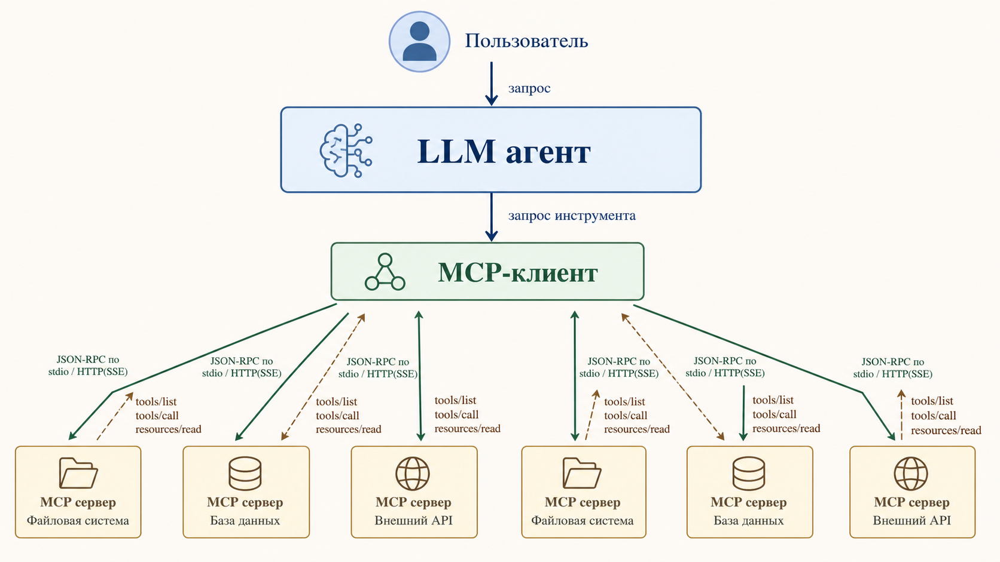

**MCP** — стандарт, предложенный Anthropic, для унификации способа, которым агенты обнаруживают и вызывают инструменты. Аналогия: если **function calling** — это сами функции, то **MCP** — это HTTP для этих функций.

**Архитектура:**

```
LLM Agent (MCP Client)
        │  JSON-RPC (stdio / SSE / WebSocket)
        ▼
    MCP Server
    ├── list_tools()      → схемы инструментов
    ├── call_tool(name, args) → результат
    └── list_resources()  → доступные данные
```

**Что реализует MCP-сервер:**
- Стандартное обнаружение (`list_tools`) — клиент не знает заранее, какие инструменты есть.
- Единый транспортный протокол (JSON-RPC 2.0).
- Управление ресурсами: файлами, БД, памятью.

**Разница с «голым» function calling:**
- Function calling — инструменты зашиты в приложение, каждый раз нужно вручную подключать.
- MCP — инструменты живут на отдельном сервере; любой совместимый агент может их использовать без изменения кода.

---


## 5. Воспроизводимость ответов

### 5.1 Почему LLM недетерминированы

Стандартная генерация токена $x_t$ — это **сэмплирование** из распределения:

$$
x_t \sim \mathrm{Categorical}\!\left(\mathrm{softmax}\!\left(\frac{z_t}{T}\right)\right),
$$

где $z_t$ — логиты, $T$ — температура. Если $T > 0$, в процесс вносится случайность через генератор псевдослучайных чисел (PRNG).

Даже при $T = 0$ (greedy decoding) на практике **воспроизводимость не гарантируется** по нескольким причинам:
- **Недетерминизм GPU операций:** CUDA операции с float16/bfloat16 могут давать разные результаты в зависимости от порядка редукций при разных batch sizes.
- **Continuous batching:** входящие запросы объединяются в динамические батчи. Один и тот же запрос может попасть в батч разного размера, что меняет вычисления attention при определённых реализациях.
- **Tensor parallelism:** при распределении модели по нескольким GPU порядок accumulation может влиять на результат.

### 5.2 Как максимально приблизиться к воспроизводимости

**В vLLM (рекомендуемый подход):**

```python
from vllm import LLM, SamplingParams

llm = LLM(model="Qwen/Qwen3-8B", seed=42)

params = SamplingParams(
    temperature=0.0,   # greedy decoding
    seed=42,
)

outputs = llm.generate(["Сколько планет в Солнечной системе?"], params)
```

В vLLM V1 параметр `seed` по умолчанию равен `0` и устанавливает состояние PRNG для всех worker'ов. При `temperature=0` + фиксированном `seed` + одинаковом железе и версии vLLM — результат воспроизводим.

**Дополнительные меры:**

```bash
# Отключение многопроцессорного планировщика (гарантирует детерминизм расписания)
VLLM_ENABLE_V1_MULTIPROCESSING=0 python my_script.py
```

Либо включить **batch invariance** (результат нечувствителен к составу батча):

```python
llm = LLM(
    model="Qwen/Qwen3-8B",
    seed=42,
    enable_batch_invariance=True,  # небольшой overhead
)
```

**Важные ограничения:**
- Воспроизводимость гарантирована только на **том же железе** и **той же версии vLLM**.
- Prefix caching может привести к тому, что часть токенов вычислена в другом контексте (другой батч) — при строгих требованиях отключайте его.
- Speculative decoding нарушает воспроизводимость (специально).

> **Практическая рекомендация.** Для research/evaluation: `temperature=0`, `seed=42`, `VLLM_ENABLE_V1_MULTIPROCESSING=0`. Для production: принимайте стохастичность как данность или используйте `seed` + `temperature=0` + задокументируйте версию железа/фреймворка.


---

# Часть 2. vLLM serve: внутреннее устройство

---

## 6. Continuous Batching

### 6.1 Проблема статического батчинга

Генерация токенов авторегрессионна: токен \(t\) зависит от \(t-1\). Разные запросы генерируют разное число токенов. При **статическом батчинге** весь батч ждёт самого длинного запроса, GPU простаивает (проблема «straggler»).

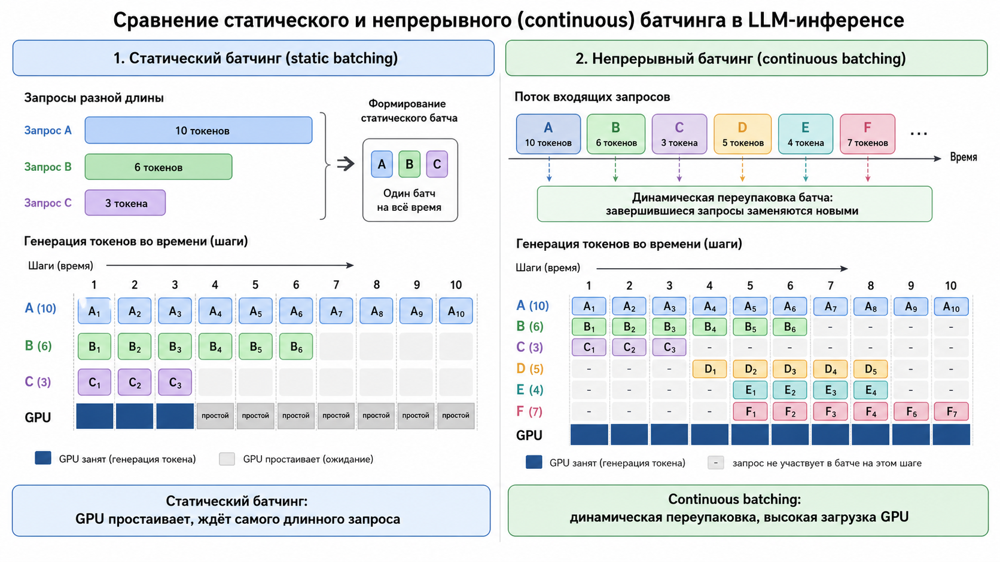

### 6.2 Continuous batching (iteration-level scheduling)

Предложено в **ORCA (OSDI 2022)**. Идея: **решение о составе батча принимается на каждой итерации**, а не раз в начале батча.

**Алгоритм:**

```
Каждый forward pass:
1. Проверить, какие последовательности завершились (EOS-токен)
2. Освободить их KV-cache блоки
3. Добавить новые ожидающие запросы — столько, сколько позволяет память
4. Сформировать «суперпоследовательность» из всех активных запросов
5. Выполнить один forward pass
6. Вернуться к шагу 1
```

**PagedAttention** (vLLM, SOSP 2023) дополняет это: KV-cache делится на **страницы** фиксированного размера (по умолчанию 16 токенов), выделяемые динамически. Это устраняет фрагментацию памяти (<4% потерь).

```
Логические блоки     Физическая память GPU
[req1: блок 0] ──→  [слот 7]
[req1: блок 1] ──→  [слот 2]
[req2: блок 0] ──→  [слот 11]
```

Результат: **до 23-24x** прирост throughput по сравнению с HuggingFace Transformers при сопоставимой латентности.

---

## 7. FlashAttention и альтернативные реализации

### 7.1 Проблема стандартного attention

Стандартный механизм внимания требует материализации матрицы \(\mathbf{A} \in \mathbb{R}^{N \times N}\):

$$
\mathrm{Attention}(\mathbf{Q}, \mathbf{K}, \mathbf{V}) = \mathrm{softmax}\!\left(\frac{\mathbf{Q}\mathbf{K}^\top}{\sqrt{d_k}}\right)\mathbf{V}.
$$

Для $N = 128\,000$ и float16 это $128000^2 \times 2 \approx 32$ GB — не влезает в HBM, не говоря уже о SRAM.

### 7.2 FlashAttention: IO-aware tiling

**FlashAttention** (Dao et al., 2022) вычисляет attention без явного сохранения матрицы \(\mathbf{A}\) в HBM. Ключевые техники:

1. **Tiling.** $\mathbf{Q}$, $\mathbf{K}$, $\mathbf{V}$ разбиваются на тайлы, которые влезают в SRAM. Attention вычисляется покусочно прямо в SRAM.

2. **Online softmax trick.** Softmax требует знать все логиты для нормировки. Online-алгоритм (Milakov & Gimelshein, 2018) позволяет обновлять softmax инкрементально по тайлам, поддерживая running maximum и sum:

$$
m^{(\text{new})} = \max(m^{(\text{old})}, \max_j s_j), \quad
\ell^{(\text{new})} = e^{m^{(\text{old})} - m^{(\text{new})}} \ell^{(\text{old})} + \sum_j e^{s_j - m^{(\text{new})}}.
$$

3. **Recomputation.** При backward pass промежуточные значения не хранятся в HBM — пересчитываются из тайлов. Это экономит память за счёт FLOPS.

4. **Kernel fusion.** Всё (matmul → softmax → matmul) — один CUDA kernel, нет overhead'а на запуск ядра.

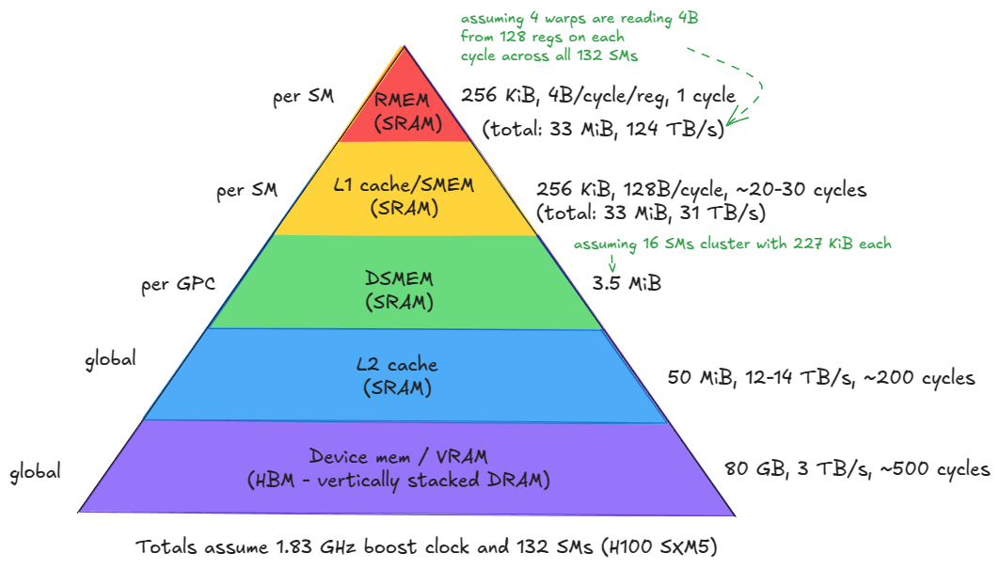

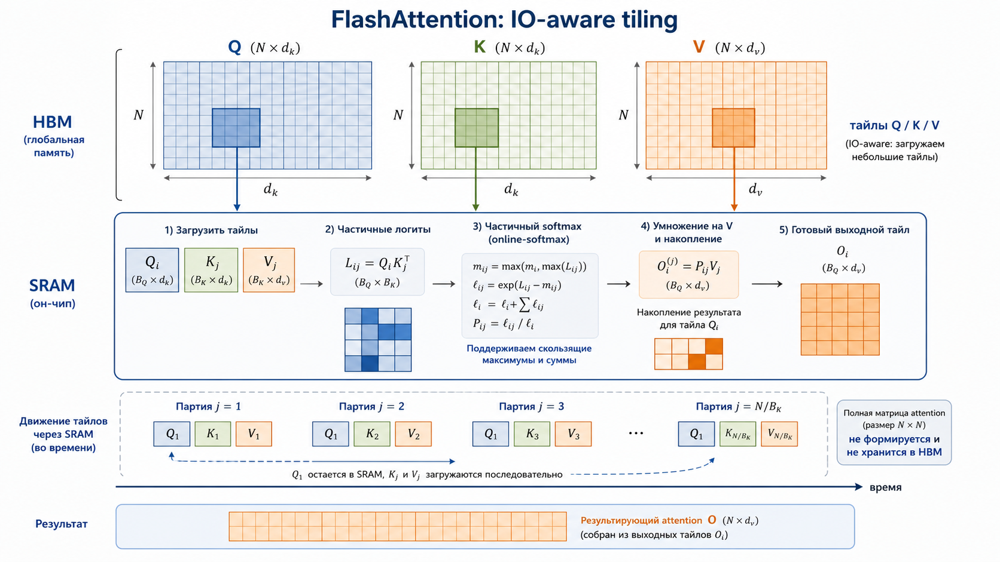

https://www.aleksagordic.com/blog/matmul - ОЧЕНЬ КРУТАЯ СТАТЬЯ!

### 7.3 Эволюция версий

| Версия | Год | Ключевое |
|---|---|---|
| FlashAttention-1 | 2022 | IO-aware tiling, fused softmax, 2–4× ускорение |
| FlashAttention-2 | 2023 | Лучший параллелизм по warp'ам, меньше non-matmul ops, 2× vs FA-1 |
| FlashAttention-3 | 2024 | Оптимизации для H100 (Hopper): FP8, асинхронные tensor cores, ~740 TFLOPS |

vLLM автоматически выбирает версию по железу: на H100 — FA-3, на A100 — FA-2. Явное переключение через `VLLM_FLASH_ATTN_VERSION`.

### 7.4 Альтернативные реализации attention в vLLM

| Метод | Описание | Когда используется |
|---|---|---|
| **FlashAttention** | IO-aware tiling | GPU с CUDA (default) |
| **FlashInfer** | Кастомные kernel'ы для inference, поддержка paged KV | Online serving, high throughput |
| **xFormers** | Memory-efficient attention от Meta | AMD / fallback |
| **PyTorch SDPA** | `scaled_dot_product_attention`, диспатчит на Flash если доступно | CPU inference / debug |
| **Chunked prefill** | Длинные prefill разбиваются на чанки, чередуясь с decode | Длинные контексты + online serving |

---

## 8. Prefix Cache и мультимодальный кэш

### 8.1 Prefix caching

Если несколько запросов начинаются с одного и того же prefix (например, длинный system prompt), **KV-cache этого префикса вычисляется один раз** и переиспользуется.

**Реализация в vLLM** — хэш-based подход:

```
Block 1: hash(None, tokens[0:16])
Block 2: hash(Block1.hash, tokens[16:32])
Block 3: hash(Block2.hash, tokens[32:48])
```

Каждый KV-блок идентифицируется хэшом **всего** предшествующего контекста. При новом запросе vLLM находит самый длинный совпадающий prefix в кэше и пропускает prefill для него.

С версии 0.11 используется SHA256 вместо простого хэша — для избежания коллизий в multi-tenant среде.

**Выгода для агентных задач:** если 1000 агентов работают с одним и тем же system prompt + набором инструментов (500 токенов), первый запрос платит полный prefill, остальные — только за новые токены.

### 8.2 Мультимодальный кэш

Изображения в VLM превращаются в тысячи токенов (например, 1024–4096 vision tokens для Qwen2.5-VL при высоком разрешении). Без кэша каждый запрос с одним и тем же изображением заново прогоняет vision encoder + attention prefill.

**Проблема с наивным prefix caching:** placeholder-токены изображения в токенном потоке одинаковы для разных изображений. Если смотреть только на токен ID — кэш даст неверный хит.

**Решение в vLLM V1 (PR #11187):** хэш KV-блока расширяется `extra_hashes`:

```python
# Хэш блока, содержащего токены изображения
hash = hash(
    parent_hash,
    block_tokens,           # токены в блоке
    (image_hash, offset),   # mm_hash изображения + смещение
)
```

`image_hash` — 16-байтовый дайджест содержимого изображения. Это гарантирует, что кэш валиден тогда и только тогда, когда **то же самое изображение**.

**Пример из LMCache:** при двух последовательных запросах с одинаковым изображением второй запрос даёт ~100% cache hit rate, TTFT (time-to-first-token) падает с десятков секунд до ~1 с.

```python
# Запуск vLLM с включённым prefix caching для VLM
vllm serve Qwen/Qwen2.5-VL-7B-Instruct \
    --enable-prefix-caching \
    --max-num-seqs 32
```

> **Нюанс безопасности.** В multi-tenant среде (несколько пользователей) мультимодальный кэш без `mm_hash` создаёт потенциальный privacy leak: KV-кэш изображения пользователя A может быть переиспользован для пользователя B, если у них похожий текстовый промпт. SHA256-хэши изображения решают эту проблему.

---


# Часть 3. Параметры сэмплирования и ускорение декодера

---

## 9. Параметры сэмплирования

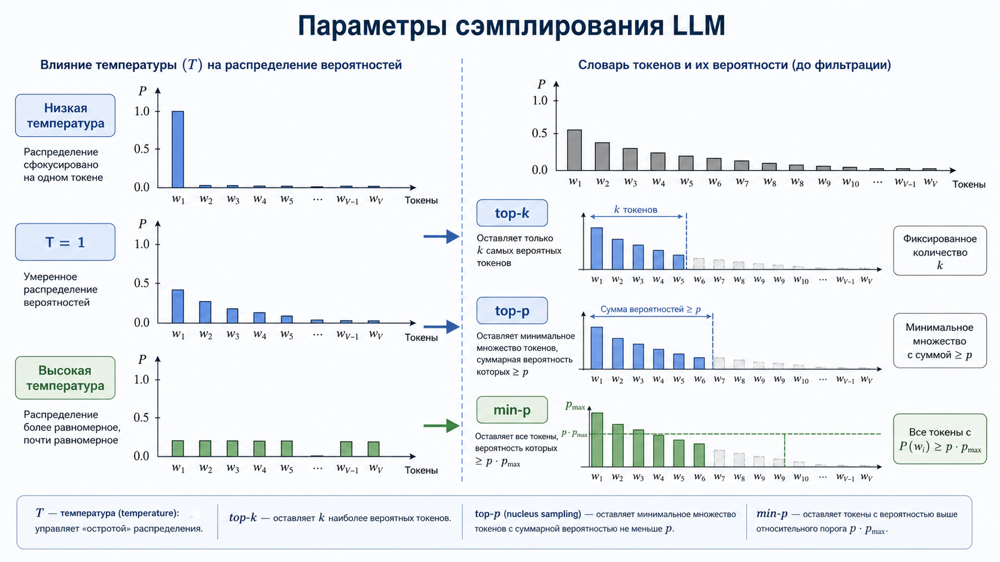

### 9.1 Температура

Температура $T$ масштабирует логиты **перед** softmax:

$$
p_i = \frac{\exp(z_i / T)}{\sum_j \exp(z_j / T)}.
$$

- $T \to 0$: распределение вырождается в дельта-функцию на argmax (greedy decoding).
- $T = 1$: исходное распределение модели без изменений.
- $T > 1$: распределение «расплющивается», менее вероятные токены получают больший шанс.

```python
params = SamplingParams(temperature=0.7)
```

**Типичные значения по задачам:**
- Math/code/factual QA: `0.0–0.3`
- Conversational assistants: `0.6–0.8`
- Creative writing: `0.9–1.2`

### 9.2 Top-k sampling

Обрезает всё, кроме $k$ наиболее вероятных токенов. Вероятности перенормируются:

$$
p'_i = \begin{cases} \frac{p_i}{\sum_{j \in \text{Top-}k} p_j} & \text{если } i \in \text{Top-}k, \\ 0 & \text{иначе.} \end{cases}
$$

```python
params = SamplingParams(top_k=50)
```

### 9.3 Top-p (nucleus) sampling

Динамически выбирает минимальное множество токенов, суммарная вероятность которых ≥ \(p\):

$$
S = \min\!\left\{S' \subseteq V : \sum_{i \in S'} p_i \geq p\right\},
$$

где токены в $S'$ упорядочены по убыванию вероятности. Переиспользуется только \(S\).

```python
params = SamplingParams(top_p=0.9)
```

> **Не используйте top-k и top-p одновременно** без необходимости: они применяются последовательно (сначала top-k, затем top-p), что усложняет интерпретацию.

### 9.4 Min-p

Относительный порог: токен включается, если его вероятность ≥ $p \cdot p_{\max}$, где $p_{\max}$ — вероятность наиболее вероятного токена. Адаптивен к «уверенности» модели в данный момент.

```python
params = SamplingParams(min_p=0.05)
```

### 9.5 Штрафы за повторение

| Параметр | Механизм | Формула |
|---|---|---|
| `repetition_penalty` | Штрафует токены из prompt + generated | $z'_i = z_i / r$ (если $z_i > 0$) или $z'_i = z_i \cdot r$ (если $z_i < 0$) |
| `frequency_penalty` | Штрафует пропорционально числу вхождений | $z'_i = z_i - f \cdot \text{count}(i)$ |
| `presence_penalty` | Штрафует за сам факт вхождения (0/1) | $z'_i = z_i - \alpha \cdot \mathbb{1}[\text{count}(i) > 0]$ |

```python
params = SamplingParams(
    repetition_penalty=1.1,   # значения > 1 снижают повторения
    frequency_penalty=0.2,
    presence_penalty=0.1,
)
```

### 9.6 Рекомендуемые наборы параметров

Для Qwen3 официально рекомендуется:

```python
# Стандартный режим
SamplingParams(temperature=0.7, top_p=0.8, top_k=20, presence_penalty=1.5)

# Thinking/reasoning режим (длинные трейсы)
SamplingParams(temperature=0.6, top_p=0.95, top_k=20)
```

> **Reasoning-специфика:** при `temperature=0` reasoning-модели часто застревают в петлях и повторяют одни и те же шаги. Рекомендуемый минимум — `temperature=0.3–0.6` даже для «детерминированных» задач с reasoning.

---


## 10. Speculative Decoding и ускорение декодера

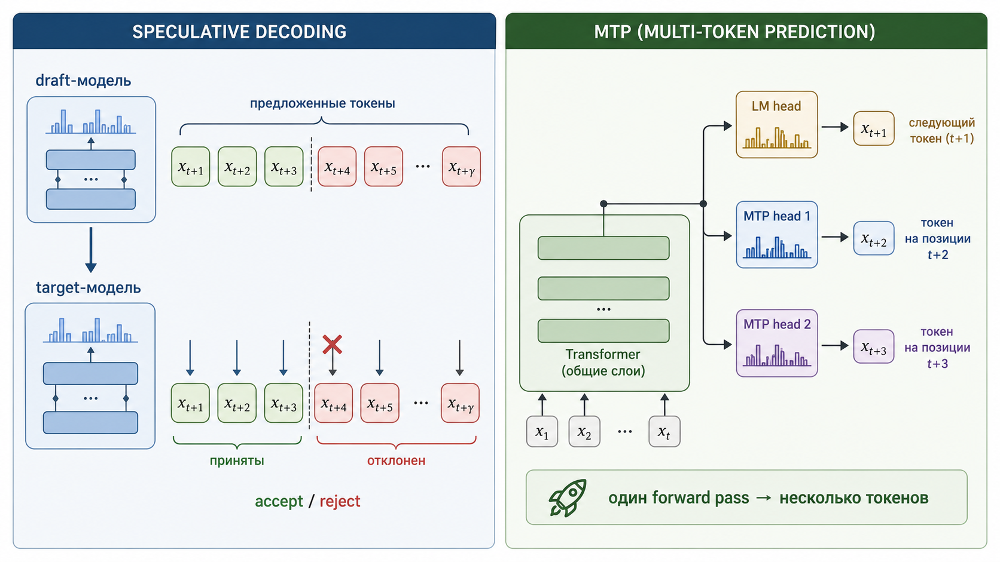

### 10.1 Проблема: узкое место авторегрессии

Декодирование токенов — **memory-bound** операция: одного токена не хватает для эффективной загрузки GPU. При генерации одного токена большая часть времени уходит на загрузку весов модели из HBM в compute-ядра, а не на вычисления.

Если бы можно было проверять несколько токенов **параллельно** — throughput вырос бы без изменения качества.

### 10.2 Speculative Decoding: идея

Базовый алгоритм (Leviathan et al., 2023; Chen et al., 2023):

1. **Маленькая draft-модель** (или другой fast mechanism) предлагает $\gamma$ токенов: $\hat{x}_{t+1}, \ldots, \hat{x}_{t+\gamma}$.
2. **Целевая модель** (target, большая) прогоняет **один** forward pass, вычисляя $p_{\text{target}}(x \mid \text{context})$ для всех $\gamma+1$ позиций **параллельно**.
3. **Rejection sampling:** каждый черновой токен $\hat{x}_{t+i}$ принимается с вероятностью:

$$
\alpha_i = \min\!\left(1,\, \frac{p_{\text{target}}(\hat{x}_{t+i})}{p_{\text{draft}}(\hat{x}_{t+i})}\right).
$$

4. Первый отклонённый токен пересэмплируется из откорректированного распределения $p_{\text{target}} - p_{\text{draft}}$ (нормализованного). Все последующие черновые токены отбрасываются.

**Теорема (lossless):** выходное распределение Speculative Decoding тождественно распределению целевой модели при стандартном авторегрессивном декодировании — при условии, что acceptance/rejection rule выполнен корректно.

<!-- ВСТАВИТЬ СХЕМУ: speculative decoding — draft → verify → accept/reject (из EAGLE paper или NVIDIA blog) -->

### 10.3 EAGLE: feature-level drafting

**EAGLE** (EAGLE-1, 2024) улучшает draft-модель: вместо авторегрессии на уровне токенов использует авторегрессию на уровне **second-to-top layer features** целевой модели.

Наблюдение: features (скрытые состояния предпоследнего слоя) значительно более предсказуемы, чем токены. Draft-модель предсказывает следующий feature-вектор \$hat{h}_{t+1}$ по конкатенации токена $x_t$ и предыдущего feature-вектора $h_t$:

$$
\hat{h}_{t+1} = f_{\theta}([x_t; h_t]),
$$

после чего из $\hat{h}_{t+1}$ через LM head целевой модели получают распределение следующего токена. Это убирает неопределённость на уровне токен-предсказания.

**EAGLE-2** добавляет **dynamic draft tree**: draft-модель предлагает дерево возможных продолжений, а не линейную цепочку. Ветви дерева формируются адаптивно на основе confidence scores.

<!-- ВСТАВИТЬ СХЕМУ: EAGLE-2 dynamic draft tree (из статьи EAGLE-2) -->

**EAGLE-3** (2025) отказывается от feature prediction в пользу прямого token prediction, использует fusion из нескольких слоёв целевой модели (низкоуровневые, средние и высокоуровневые features), обучается с **training-time test** — симуляцией acceptance-rejection прямо при обучении draft-модели. Результат: **5.6× ускорение** vs vanilla AR decoding.

| Метод | Speedup (vs greedy) | Качество |
|---|---|---|
| Medusa (параллельные головы) | 2.2× | Потери возможны |
| EAGLE-1 | ~3× | Lossless |
| EAGLE-2 | ~4× | Lossless |
| EAGLE-3 | ~5.6× | Lossless |

### 10.4 MTP (Multi-Token Prediction)

**MTP** — встроенная в саму целевую модель способность предсказывать несколько токенов за один forward pass. Не требует отдельной draft-модели.

Архитектурно: к стандартному transformer добавляются `k` дополнительных «MTP-голов», каждая из которых предсказывает токен на \(i\) шагов вперёд. При обучении все головы обучаются с соответствующим causal attention masking.

```
Input:  [t1, t2, t3, t4]
LM head:          → p(t5)         (standard)
MTP head 1:       → p(t6)         (predict 2 tokens ahead)
MTP head 2:       → p(t7)         (predict 3 tokens ahead)
```

При inference: основная голова и MTP-головы предлагают $\gamma+1$ токенов, которые затем верифицируются по стандартной rejection sampling схеме в одном forward pass.

Модели с нативным MTP: DeepSeek-V3, DeepSeek-R1 (2 MTP-модуля), Gemma 4.

**Включение в vLLM:**

```bash
vllm serve deepseek-ai/DeepSeek-V3 \
    --speculative-config '{"method": "deepseek_mtp", "num_speculative_tokens": 2}'
```

```bash
vllm serve google/gemma-4-E2B-it \
    --speculative-config '{"method": "mtp", "model": "gg-hf-am/gemma-4-E2B-it-assistant", "num_speculative_tokens": 1}'
```

### 10.5 Другие методы

| Метод | Идея | Особенность |
|---|---|---|
| **Medusa** | Параллельные головы над target LLM без отдельной модели | Небольшой accuracy tradeoff |
| **Lookahead** | Jacobi decoding: параллельное обновление нескольких позиций | Training-free |
| **Prompt Lookup Decoding** | N-gram поиск в input prompt как draft | Работает без моделей, хорошо для summarization |
| **Draft-model (standard)** | Маленькая модель того же семейства | Универсально |

### 10.6 Когда speculative decoding выгоден

- **Latency-bound** задачи (чат, интерактивные агенты): всегда выгоден.
- **Throughput-bound** (batch processing): зависит от acceptance rate — при низком rate overhead от черновой модели не окупается.
- MoE-модели (Qwen3-30B-A3B, DeepSeek-V3): speculative decoding особенно эффективен, так как decode step у MoE и без того быстрый, а verify pass ещё быстрее.

---